In [50]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud, STOPWORDS


In [51]:
%pwd

'/home/ayush/Ayush/hackathon/DataThon/retail_transaction'

In [52]:
df= pd.read_csv("experiments/data/customer_shopping_data.csv")

In [53]:
df=pd.DataFrame(df)

In [54]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,invoice_date,shopping_mall
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,5/8/2022,Kanyon
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,12/12/2021,Forum Istanbul
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,9/11/2021,Metrocity
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,16/05/2021,Metropol AVM
4,I337046,C189076,Female,53,Books,4,60.60,Cash,24/10/2021,Kanyon


In [55]:
df=df.rename(columns={"invoice_date":"Date","shopping_mall":"mall"})

In [56]:
print("Number of Rows:",df.shape[0],"\nNumber of Columns:",df.shape[1])

Number of Rows: 99457 
Number of Columns: 10


In [57]:
df.columns

Index(['invoice_no', 'customer_id', 'gender', 'age', 'category', 'quantity',
       'price', 'payment_method', 'Date', 'mall'],
      dtype='object')

In [58]:
cat_cols=[]
num_cols=[]
for cols in df.columns:
    if(df[cols].dtype==object):
        cat_cols.append(cols)
    else:
        num_cols.append(cols)

In [59]:
cat_cols

['invoice_no',
 'customer_id',
 'gender',
 'category',
 'payment_method',
 'Date',
 'mall']

In [60]:
num_cols

['age', 'quantity', 'price']

In [61]:
for cols in num_cols:
    print(df[cols].isnull().sum())
    

0
0
0


In [62]:
for cols in cat_cols:
    print(df[cols].isnull().sum())
    

0
0
0
0
0
0
0


In [63]:
df[cat_cols].nunique()

invoice_no        99457
customer_id       99457
gender                2
category              8
payment_method        3
Date                797
mall                 10
dtype: int64

In [64]:
for cat in cat_cols:
    if(cat !="invoice_no" and cat !="customer_id" and cat != "Date"):
        val=df[cat].nunique()
        print(f"{cat}: {val} ",end='')
        print(df[cat].unique())

gender: 2 ['Female' 'Male']
category: 8 ['Clothing' 'Shoes' 'Books' 'Cosmetics' 'Food & Beverage' 'Toys'
 'Technology' 'Souvenir']
payment_method: 3 ['Credit Card' 'Debit Card' 'Cash']
mall: 10 ['Kanyon' 'Forum Istanbul' 'Metrocity' 'Metropol AVM' 'Istinye Park'
 'Mall of Istanbul' 'Emaar Square Mall' 'Cevahir AVM' 'Viaport Outlet'
 'Zorlu Center']


In [65]:
for col in cat_cols:
    if(col !="invoice_no" and col !="customer_id" and col != "Date"):
        print(df[col].value_counts())
        # print(f"here is the total count:{len(df[col].value_counts())}")
        print("======================")

gender
Female    59482
Male      39975
Name: count, dtype: int64
category
Clothing           34487
Cosmetics          15097
Food & Beverage    14776
Toys               10087
Shoes              10034
Souvenir            4999
Technology          4996
Books               4981
Name: count, dtype: int64
payment_method
Cash           44447
Credit Card    34931
Debit Card     20079
Name: count, dtype: int64
mall
Mall of Istanbul     19943
Kanyon               19823
Metrocity            15011
Metropol AVM         10161
Istinye Park          9781
Zorlu Center          5075
Cevahir AVM           4991
Forum Istanbul        4947
Viaport Outlet        4914
Emaar Square Mall     4811
Name: count, dtype: int64


In [66]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,Date,mall
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,5/8/2022,Kanyon
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,12/12/2021,Forum Istanbul
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,9/11/2021,Metrocity
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,16/05/2021,Metropol AVM
4,I337046,C189076,Female,53,Books,4,60.60,Cash,24/10/2021,Kanyon


In [67]:
df['Date'] = pd.to_datetime(df['Date'],format='%d/%m/%Y', errors='raise')

In [68]:
df['day'] = (df['Date']).dt.day
df['month'] = (df['Date']).dt.month
df['year'] = (df['Date']).dt.year

In [69]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,Date,mall,day,month,year
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,2022-08-05,Kanyon,5,8,2022
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,2021-12-12,Forum Istanbul,12,12,2021
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,2021-11-09,Metrocity,9,11,2021
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,2021-05-16,Metropol AVM,16,5,2021
4,I337046,C189076,Female,53,Books,4,60.60,Cash,2021-10-24,Kanyon,24,10,2021


In [70]:
df.loc[(df['month'] ==1), 'month'] = 'January'
df.loc[(df['month'] ==2), 'month'] = 'February'
df.loc[(df['month'] ==3), 'month'] = 'March'
df.loc[(df['month'] ==4), 'month'] = 'April'
df.loc[(df['month'] ==5), 'month'] = 'May'
df.loc[(df['month'] ==6), 'month'] = 'June'
df.loc[(df['month'] ==7), 'month'] = 'July'
df.loc[(df['month'] ==8), 'month'] = 'August'
df.loc[(df['month'] ==9), 'month'] = 'September'
df.loc[(df['month'] ==10), 'month'] = 'October'
df.loc[(df['month'] ==11), 'month'] = 'November'
df.loc[(df['month'] ==12), 'month'] = 'December'

/tmp/ipykernel_155567/3057846671.py:1: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'January' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.



In [71]:
df['month'].unique()

array(['August', 'December', 'November', 'May', 'October', 'March',
       'January', 'July', 'June', 'February', 'April', 'September'],
      dtype=object)

In [72]:
df.month.value_counts()

month
January      11608
February     10482
March         8730
July          7877
October       7764
May           7697
December      7680
August        7635
June          7581
November      7563
April         7487
September     7353
Name: count, dtype: int64

In [73]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,Date,mall,day,month,year
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,2022-08-05,Kanyon,5,August,2022
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,2021-12-12,Forum Istanbul,12,December,2021
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,2021-11-09,Metrocity,9,November,2021
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,2021-05-16,Metropol AVM,16,May,2021
4,I337046,C189076,Female,53,Books,4,60.60,Cash,2021-10-24,Kanyon,24,October,2021


In [74]:
df.month.value_counts()

month
January      11608
February     10482
March         8730
July          7877
October       7764
May           7697
December      7680
August        7635
June          7581
November      7563
April         7487
September     7353
Name: count, dtype: int64

/tmp/ipykernel_155567/3170034362.py:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




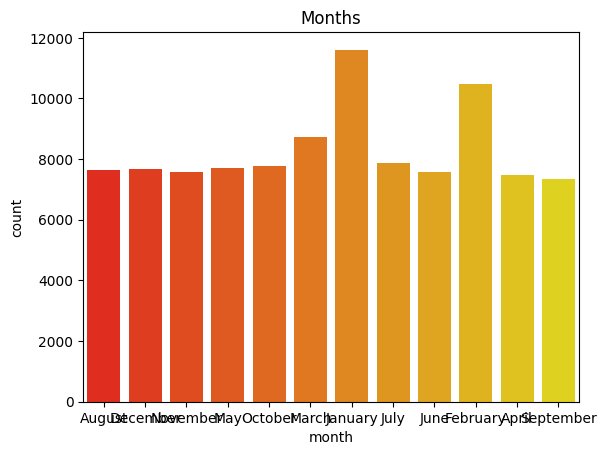

In [75]:
sns.countplot(x="month", data =df,palette="autumn").set_title("Months") 
plt.show()

In [76]:
fig = px.pie(df, values='price', names='month')
fig.show()

/tmp/ipykernel_155567/78271742.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




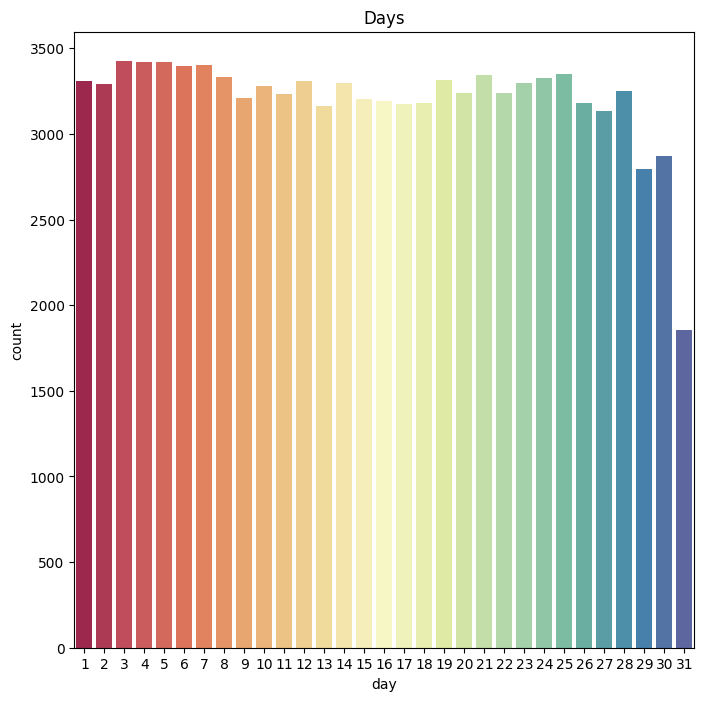

In [77]:
plt.figure(figsize = (8,8))
sns.countplot(x="day", data =df,palette="Spectral").set_title("Days") 
plt.show()

In [78]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,Date,mall,day,month,year
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,2022-08-05,Kanyon,5,August,2022
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,2021-12-12,Forum Istanbul,12,December,2021
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,2021-11-09,Metrocity,9,November,2021
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,2021-05-16,Metropol AVM,16,May,2021
4,I337046,C189076,Female,53,Books,4,60.60,Cash,2021-10-24,Kanyon,24,October,2021


/tmp/ipykernel_155567/4243065127.py:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




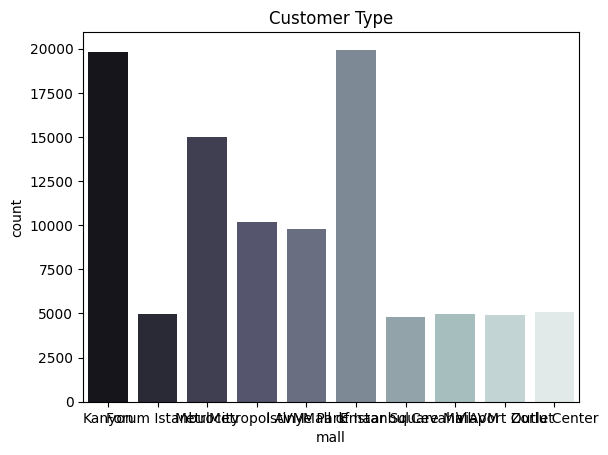

In [79]:
sns.countplot(x="mall", data =df,palette="bone").set_title("Customer Type") 
plt.show()

In [80]:
fig = px.pie(df, values='price', names='mall')
fig.show()

In [81]:
df.gender.value_counts()

gender
Female    59482
Male      39975
Name: count, dtype: int64

/tmp/ipykernel_155567/594322750.py:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




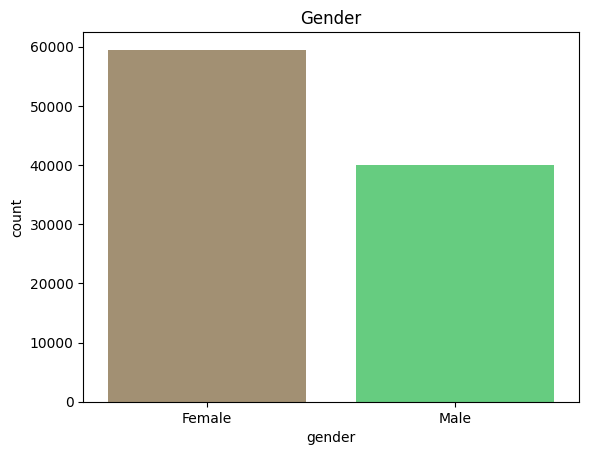

In [82]:
sns.countplot(x="gender", data =df,palette="terrain_r").set_title("Gender") 
plt.show()

In [83]:
fig = px.pie(df, values='price', names='gender')
fig.show()

In [84]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,Date,mall,day,month,year
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,2022-08-05,Kanyon,5,August,2022
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,2021-12-12,Forum Istanbul,12,December,2021
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,2021-11-09,Metrocity,9,November,2021
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,2021-05-16,Metropol AVM,16,May,2021
4,I337046,C189076,Female,53,Books,4,60.60,Cash,2021-10-24,Kanyon,24,October,2021


In [85]:
df.category.value_counts()

category
Clothing           34487
Cosmetics          15097
Food & Beverage    14776
Toys               10087
Shoes              10034
Souvenir            4999
Technology          4996
Books               4981
Name: count, dtype: int64

/tmp/ipykernel_155567/1403223140.py:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




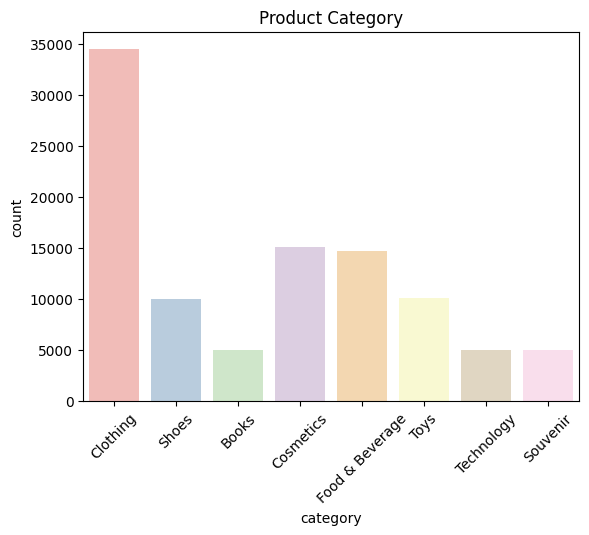

In [86]:
sns.countplot(x="category", data =df,palette="Pastel1").set_title("Product Category") 
plt.xticks(rotation=45)
plt.show()

In [87]:
fig = px.pie(df, values='price', names='category')
fig.show()

In [88]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,Date,mall,day,month,year
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,2022-08-05,Kanyon,5,August,2022
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,2021-12-12,Forum Istanbul,12,December,2021
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,2021-11-09,Metrocity,9,November,2021
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,2021-05-16,Metropol AVM,16,May,2021
4,I337046,C189076,Female,53,Books,4,60.60,Cash,2021-10-24,Kanyon,24,October,2021


In [89]:
df.quantity.value_counts()


quantity
3    20149
5    19990
2    19828
1    19767
4    19723
Name: count, dtype: int64

/tmp/ipykernel_155567/4167489004.py:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




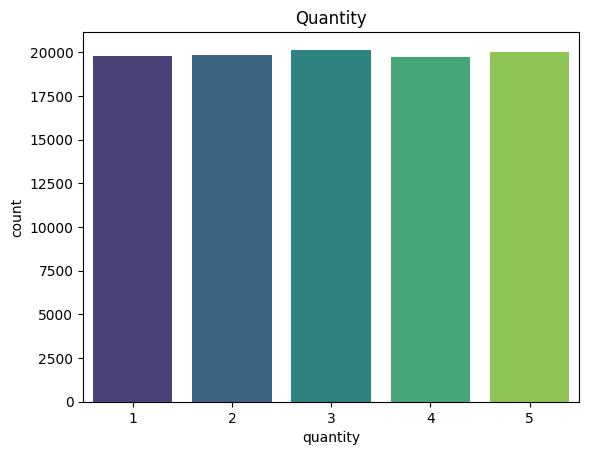

In [90]:
sns.countplot(x="quantity", data =df,palette="viridis").set_title("Quantity") 
plt.show()

In [91]:
fig = px.pie(df, values='price', names='quantity')
fig.show()

In [92]:
df.payment_method.value_counts()

payment_method
Cash           44447
Credit Card    34931
Debit Card     20079
Name: count, dtype: int64

/tmp/ipykernel_155567/568847294.py:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




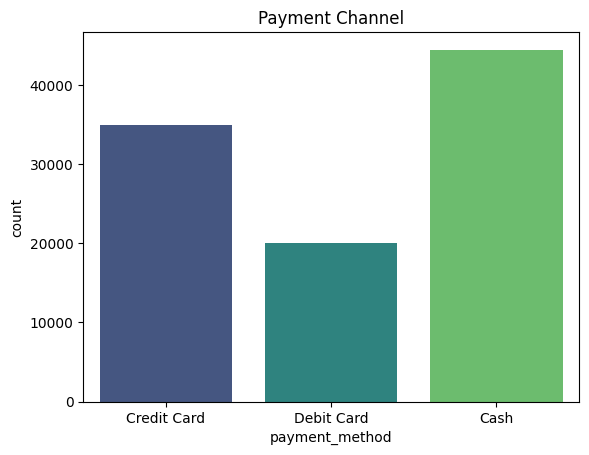

In [93]:
sns.countplot(x="payment_method", data =df,palette="viridis").set_title("Payment Channel") 
plt.show()

<Axes: xlabel='age', ylabel='Count'>

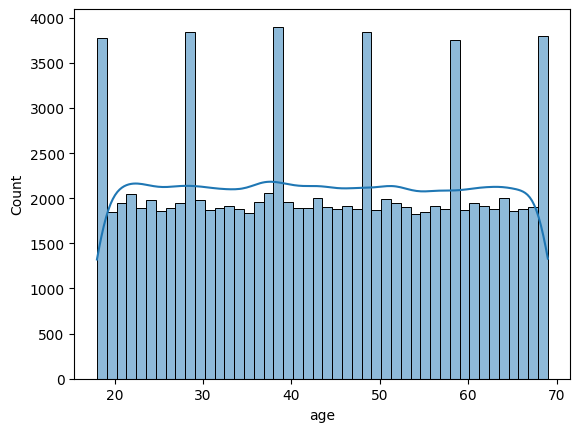

In [94]:
sns.histplot(df['age'],kde=True)

/tmp/ipykernel_155567/4211471169.py:1: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




Text(0.5, 1.0, 'Payment Channel')

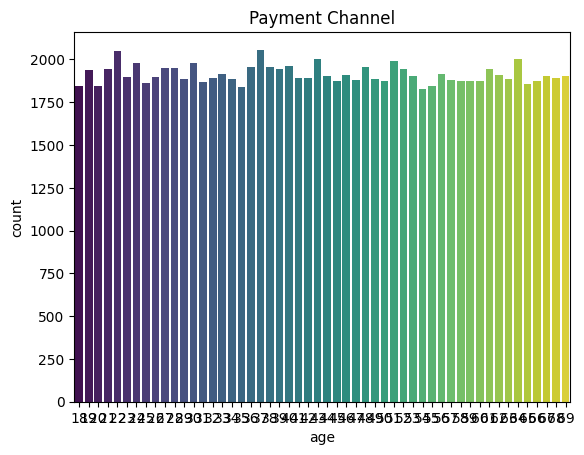

In [95]:
sns.countplot(x="age", data =df,palette="viridis").set_title("Payment Channel") 


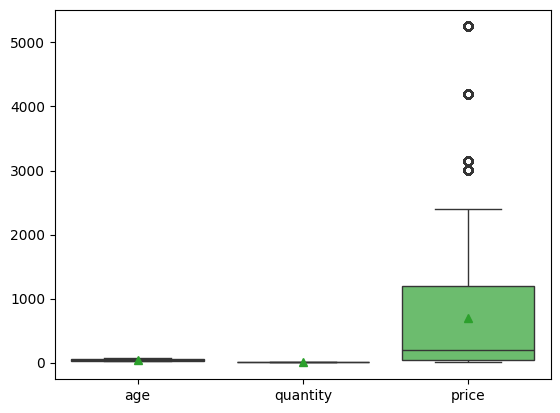

In [96]:
# sns.boxplot(df[num_cols])
sns.boxplot(df[num_cols],palette="viridis",showmeans=True)

plt.show()

/tmp/ipykernel_154575/3332852884.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/tmp/ipykernel_154575/3332852884.py:15: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_154575/3332852884.py:34: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



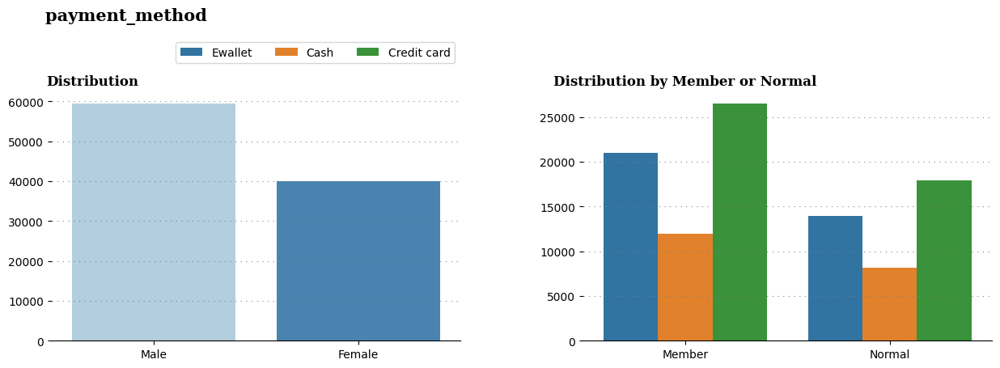

In [ ]:
fig = plt.figure(figsize=(15,4))
gs = fig.add_gridspec(1, 2)
gs.update(wspace=0.3, hspace=0)
fig.text(0.120,1.1,'payment_method ', fontfamily='serif',fontsize=15, fontweight='bold')
ax0 = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1])


sns.countplot(x='gender',
           data=df,
            palette='Blues',
           ax=ax0)
ax0.grid(color='gray', linestyle=':', axis='y', zorder=0,  dashes=(1,5))
ax0.set_title('Distribution',fontsize=12,fontfamily='serif',fontweight='bold',x=0.1,y=1)
ax0.set_xticklabels(["Male","Female"])
ax0.spines['top'].set_visible(False)
ax0.spines['right'].set_visible(False)
ax0.spines['left'].set_visible(False)
ax0.set_xlabel("")
ax0.set_ylabel("")   

sns.countplot(x='gender',
             data=df,
             hue='payment_method',
             ax=ax1)
ax1.grid(color='gray', linestyle=':', axis='y', zorder=0,  dashes=(1,5))
ax1.set_title('Distribution by Gender',fontsize=12,fontfamily='serif',fontweight='bold',x=0.25,y=1)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.get_legend().remove()
legend_labels, _= ax1.get_legend_handles_labels()
ax1.legend(legend_labels, ['Ewallet', 'Cash',"Credit card"], ncol=3, bbox_to_anchor=(-0.30, 1.22))
ax1.set_xticklabels(["Member","Normal"])
ax1.set_xlabel("")
ax1.set_ylabel("")

plt.show()

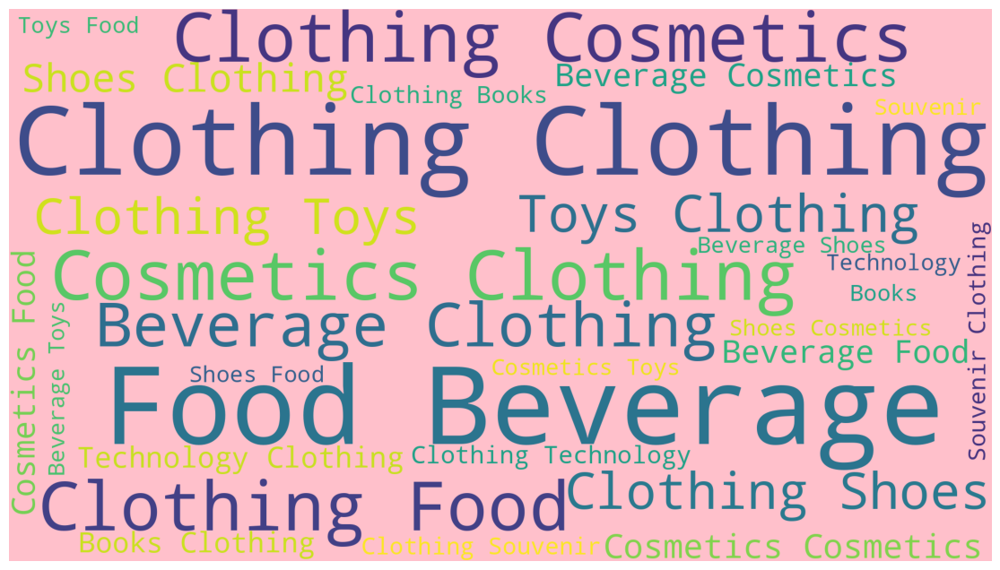

In [114]:
plt.subplots(figsize=(20,8))
wordcloud = WordCloud(background_color='pink',width=1920,height=1080).generate(" ".join(df['category']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

In [100]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,Date,mall,day,month,year
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,2022-08-05,Kanyon,5,August,2022
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,2021-12-12,Forum Istanbul,12,December,2021
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,2021-11-09,Metrocity,9,November,2021
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,2021-05-16,Metropol AVM,16,May,2021
4,I337046,C189076,Female,53,Books,4,60.60,Cash,2021-10-24,Kanyon,24,October,2021


/tmp/ipykernel_155567/2393780976.py:2: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




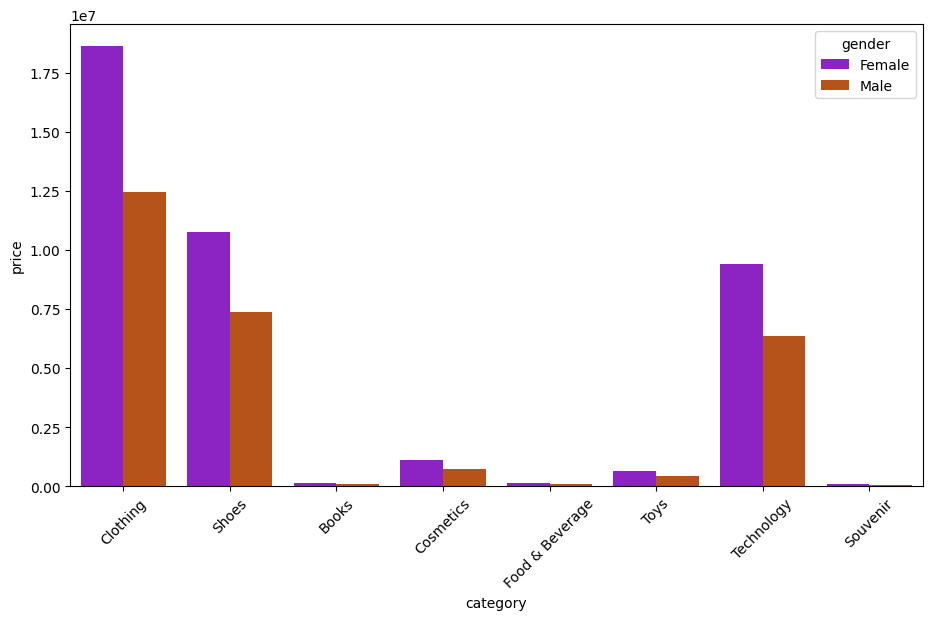

In [101]:

plt.figure(figsize=(11,6))
sns.barplot(x='category', y = 'price', hue = 'gender', data = df, estimator = sum, ci = None,palette="gnuplot")
plt.xticks(rotation=45)
plt.show()


In [103]:
df.head()

,invoice_no,customer_id,gender,age,category,quantity,price,payment_method,Date,mall,day,month,year
0,I138884,C241288,Female,28,Clothing,5,1500.40,Credit Card,2022-08-05,Kanyon,5,August,2022
1,I317333,C111565,Male,21,Shoes,3,1800.51,Debit Card,2021-12-12,Forum Istanbul,12,December,2021
2,I127801,C266599,Male,20,Clothing,1,300.08,Cash,2021-11-09,Metrocity,9,November,2021
3,I173702,C988172,Female,66,Shoes,5,3000.85,Credit Card,2021-05-16,Metropol AVM,16,May,2021
4,I337046,C189076,Female,53,Books,4,60.60,Cash,2021-10-24,Kanyon,24,October,2021


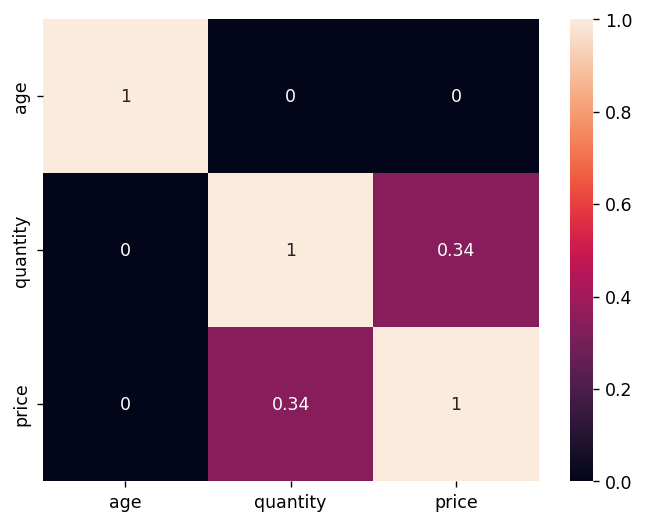

In [113]:
# Not useful
plt.figure(dpi=125)
sns.heatmap(np.round(df[num_cols].corr(),2),annot=True)
plt.show()

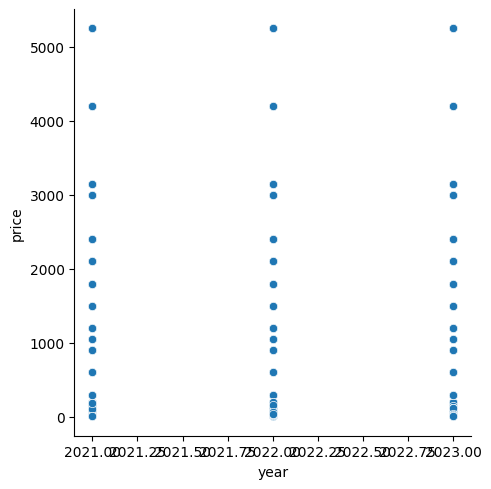

In [123]:
sns.relplot(x = "year", y = "price", data = df, kind = "scatter")
plt.show()

In [138]:
def count_plot(x_axis, hue = None, rotation = 0):
    """
    1) input : x_axis, column name, data type must be object or categorical
    3) output : cout plot using seaborn modules, unique values in x-axis and frequency in y-axis
    4) use bar_label to show frequency of each unique values above each column in graph
    """
    graph = sns.countplot(x = x_axis, data = df, hue = hue, order = df[x_axis].value_counts().index)
    for container in graph.containers:
        graph.bar_label(container)
        
        
    plt.xticks(rotation = rotation)
    plt.show()



def box_plot(x_axis = None, y_axis = None, hue = None, col = None):
    """
    input : x_axis, y_axis and hue column, column data type must be numeric in y_axis
    output : box plot to see distribution of column values such as min,max,mean,medien,std
    """
    sns.catplot(x = x_axis, y = y_axis, data = data, hue = hue, kind = "box", col = col)
    plt.xlabel(x_axis)
    plt.ylabel("FRQ")
    plt.show()

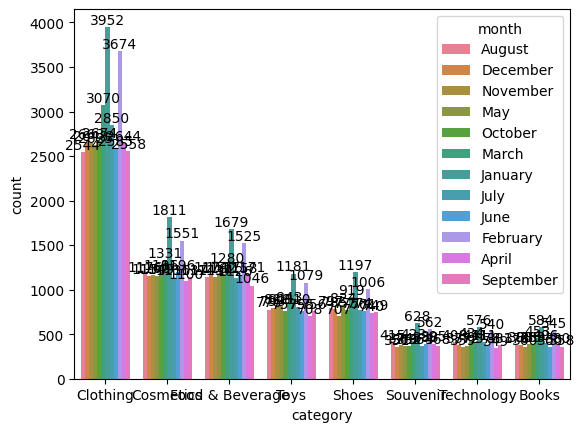

In [132]:
count_plot(x_axis = "category", hue = "month")

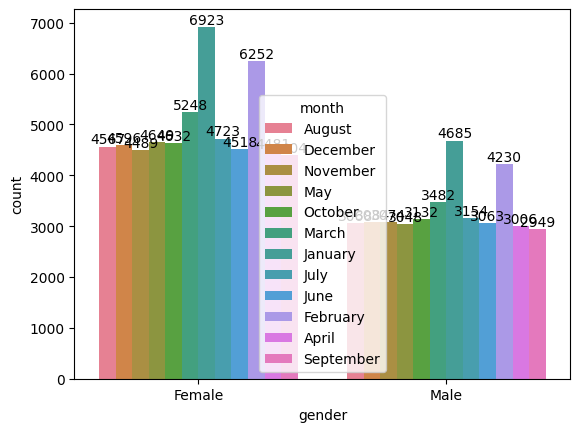

In [133]:
count_plot(x_axis = "gender", hue = "month")

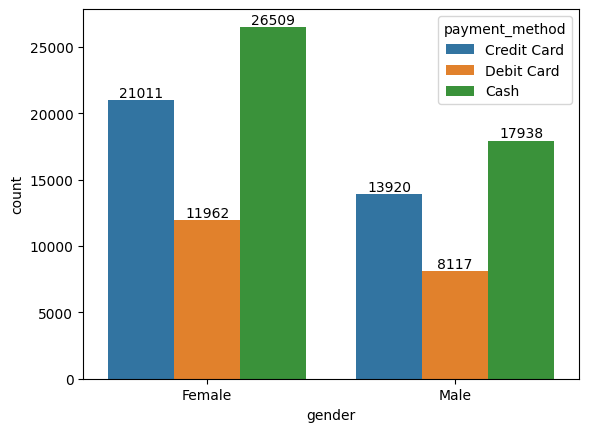

In [134]:
count_plot(x_axis = "gender", hue = "payment_method")

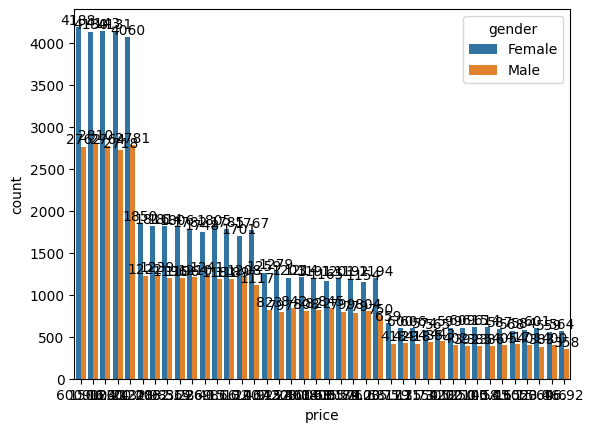

In [137]:
count_plot(x_axis = "price", hue = "gender")